In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# !pip install --upgrade tensorflow
# !pip install tensorflow

In [ ]:
# !pip install opencv-python

In [ ]:
import pathlib
import warnings
warnings.simplefilter('ignore')


if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4065, done.
remote: Counting objects: 100% (4065/4065), done.
remote: Compressing objects: 100% (3105/3105), done.
remote: Total 4065 (delta 1184), reused 1934 (delta 900), pack-reused 0
Receiving objects: 100% (4065/4065), 54.72 MiB | 29.63 MiB/s, done.
Resolving deltas: 100% (1184/1184), done.


In [ ]:
# object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 78.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 61.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.3/47.3 MB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 15.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 55.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.2/241.2 kB 32.1 MB/s eta 0:00:00
     ━━━━━━━━

In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0


In [ ]:
import matplotlib
import matplotlib.pyplot as plt

import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import pickle
from tqdm import tqdm
import pandas as pd
import cv2

import tensorflow as tf


from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

In [ ]:
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
!nvidia-smi


Fri Dec 22 04:32:49 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   76C    P0              33W /  70W |   8317MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
def image_into_numpy_array_frompath(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size #This line extracts the width and height of the image using the size attribute
  # of the Image object. This information will be used later to reshape the array.
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)
# returns the resulting NumPy array representing the image


def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

In [ ]:
# train_image_dir = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/images'
# labels_dir = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/labels'
#
# image_files1 = os.listdir(train_image_dir)
# # label_files1 = os.listdir(labels_dir)

# data = []

# for image_file in tqdm(image_files1):
#     image_path = os.path.join(train_image_dir, image_file)
#     corresponding_label = image_file.split('.')[0] + '.txt'
#     label_path = os.path.join(labels_dir, corresponding_label)
#     data.append({
#         'image_name': image_file,
#         'image_path': image_path,
#         'label_file_name': corresponding_label,
#         'label_file_path': label_path
#     })

# df = pd.DataFrame(data)
# df_sorted = df.sort_values("image_names")

In [ ]:
# train_image_dir = '/content/drive/MyDrive/data/train/images'
# /content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/images

train_image_dir = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/images'


dt_batch_size = 32
split_val = 0.2

image_dataset, validation_ds = tf.keras.utils.image_dataset_from_directory(
    train_image_dir,
    image_size=(1280,1280),
    batch_size= dt_batch_size,
    label_mode=None,
    shuffle=False,
    validation_split= split_val,
    subset="both",
    labels = None,
    color_mode = 'rgb' )

AUTOTUNE = tf.data.AUTOTUNE
image_dataset = image_dataset.prefetch(buffer_size=AUTOTUNE)

Found 6471 files belonging to 1 classes.
Using 5177 files for training.
Using 1294 files for validation.


In [ ]:
# def load_image_into_numpy_array(input_tensors):
#     """
#     Load images from a list of input tensors into a numpy array.

#     Args:
#         input_tensors: a list of TensorFlow tensors representing images.

#     Returns:
#         uint8 numpy array with shape (num_images, img_height, img_width, 3)
#     """
#     image_arrays = []

#     for tensor in input_tensors:
#         img_data = tf.io.encode_jpeg(tensor).numpy()
#         image = Image.open(BytesIO(img_data))
#         (im_width, im_height) = image.size
#         image_array = np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)
#         image_arrays.append(image_array)

#     result_array = np.stack(image_arrays, axis=0)
#     return result_array

# image_info_list = []

# for i, batch in enumerate(image_dataset):

#     if i % 12 == 0:

#         first_image_tensor = batch[0]
#         last_image_tensor = batch[-1]

#         image_info_list.append(first_image_tensor)
#         image_info_list.append(last_image_tensor)

# image_info_array = tf.stack(image_info_list).numpy()
# img_array = load_image_into_numpy_array(image_info_array)

In [ ]:

# image_info_list = []

# for i, batch in enumerate(validation_ds):

#     if i % 2 == 0:

#         first_image_tensor = batch[0]
#         last_image_tensor = batch[-1]

#         image_info_list.append(first_image_tensor)
#         image_info_list.append(last_image_tensor)

# image_info_array = tf.stack(image_info_list).numpy()
# img_array = load_image_into_numpy_array(image_info_array)

In [ ]:
# # path_list = df.image_path.to_list()

# sublist_length = len(path_list) // 7

# # Create 7 separate new lists for each sublist
# sublist1 = path_list[:sublist_length]
# sublist2 = path_list[sublist_length:2*sublist_length]
# sublist3 = path_list[2*sublist_length:3*sublist_length]
# sublist4 = path_list[3*sublist_length:4*sublist_length]
# sublist5 = path_list[4*sublist_length:5*sublist_length]
# sublist6 = path_list[5*sublist_length:6*sublist_length]
# sublist7 = path_list[6*sublist_length:]

In [ ]:
# pickle_file_path1 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/train_images_np1.pickle'
# pickle_file_path2 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/train_images_np2.pickle'
# pickle_file_path3 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/train_images_np3.pickle'
# pickle_file_path4 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/train_images_np4.pickle'
# pickle_file_path5 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/train_images_np5.pickle'
# pickle_file_path6 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/train_images_np6.pickle'
# pickle_file_path7 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/train_images_np7.pickle'


In [ ]:
# image_names = df_sorted.image_name.to_list()

# # /content/drive/MyDrive/data/train/labels


# label_files = os.listdir(labels_dir)

# label_files = sorted([file for file in label_files if file.endswith('.txt')])

# gt_boxes = []
# label_filename = []

# for image_name in tqdm(image_names):
#     label_file_name = image_name.replace('.jpg', '.txt')
#     label_file_path = os.path.join(labels_dir, label_file_name)
#     if os.path.exists(label_file_path):
#       with open(label_file_path, 'r') as file:
#           lines = file.readlines()
#           lines = sorted(lines)  # Sorting lines in alphabetical order

#           box_data_for_file = []

#           for line in lines: #Always keep the lines range higher than image range
#               values = line.strip().split()
#               class_label, x_center, y_center , width, height = map(float, values)
#               image_width =  1280
#               image_height =  1280
#               x_min = (x_center - width / 2) #top left bottom right format
#               y_min = (y_center - height / 2) #top left bottom right format
#               x_max = (x_center + width / 2) #top left bottom right format
#               y_max = (y_center + height / 2) #top left bottom right format


#               # Here, the required input gt box format is [ymin, xmin, ymax, xmax].

#               parsed_gt_box_data = [round(y_min, 4), round(x_min, 4), round(y_max, 4), round(x_max, 4)]

#               box_data_for_file.append(parsed_gt_box_data)

#           gt_boxes.append(box_data_for_file)

# gt_boxes

In [ ]:
# pickle_filepath_samplegt = '/content/drive/MyDrive/data/train/labels/train_pickels/gt_sample.pickle'
# # with open(pickle_filepath_samplegt, 'wb') as f: pickle.dump(gt_boxes, f)
# with open(pickle_filepath_samplegt, 'rb') as f: gt_boxes_sample = pickle.load(f)

In [ ]:
# gt_boxes_sorted = gt_boxes_sample

In [ ]:
pickle_file_path10 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/train_pickels/gt_boxes_sorted.pickle'
# # with open(pickle_file_path10, 'wb') as f: pickle.dump(gt_boxes, f)
with open(pickle_file_path10, 'rb') as f: gt_boxes_sorted = pickle.load(f)

In [ ]:
c = round(len(gt_boxes_sorted) * (1-split_val))

train_list = gt_boxes_sorted[:c]
val_list = gt_boxes_sorted[c:]

gt_box_ds = tf.data.Dataset.from_tensor_slices(train_list).batch(dt_batch_size)
val_box_ds = tf.data.Dataset.from_tensor_slices(val_list).batch(dt_batch_size)

gt_box_list= list(gt_box_ds)
val_box_list= list(val_box_ds)

In [ ]:
num_classes = 5

category_index = {
    1: {'id': 1, 'name': 'Golf Ball'},
    2: {'id': 2, 'name': 'Golf Stick'},
    3: {'id': 3, 'name': 'Person'},
    4: {'id': 4, 'name': 'Hand'},
    5: {'id': 5, 'name': 'Clubhead'}
}

adjusted_classes = np.arange(5) + 1
zero_indexed_groundtruth_classes = tf.convert_to_tensor(adjusted_classes, dtype=tf.int8)  # Hard coded

gt_classes_one_hot_tensors= (tf.one_hot(zero_indexed_groundtruth_classes, num_classes))
# gt_classes_list = list(gt_classes_one_hot_tensors)
gt_classes_batch = tf.tile(tf.expand_dims(gt_classes_one_hot_tensors, axis=0), [dt_batch_size, 1, 1])
gt_class_list = tf.unstack(gt_classes_batch, axis=0)
# print('Done prepping data.')


In [ ]:
# label_info_list = []

# for i, batch in enumerate(gt_box_ds):

#     if i % 12 == 0:

#         first_image_label = batch[0]
#         last_image_label = batch[-1]

#         label_info_list.append(first_image_label)
#         label_info_list.append(last_image_label)

# label_info_array = tf.stack(label_info_list).numpy()

# label_info_numpy_list = [tensor.numpy() for tensor in label_info_list]
# label_info_numpy_array = np.array(label_info_numpy_list)

In [ ]:
# label_info_list = []

# for i, batch in enumerate(val_box_ds):

#     if i % 2 == 0:

#         first_image_label = batch[0]
#         last_image_label = batch[-1]

#         label_info_list.append(first_image_label)
#         label_info_list.append(last_image_label)

# label_info_array = tf.stack(label_info_list).numpy()

# label_info_numpy_list = [tensor.numpy() for tensor in label_info_list]
# label_info_numpy_array = np.array(label_info_numpy_list)

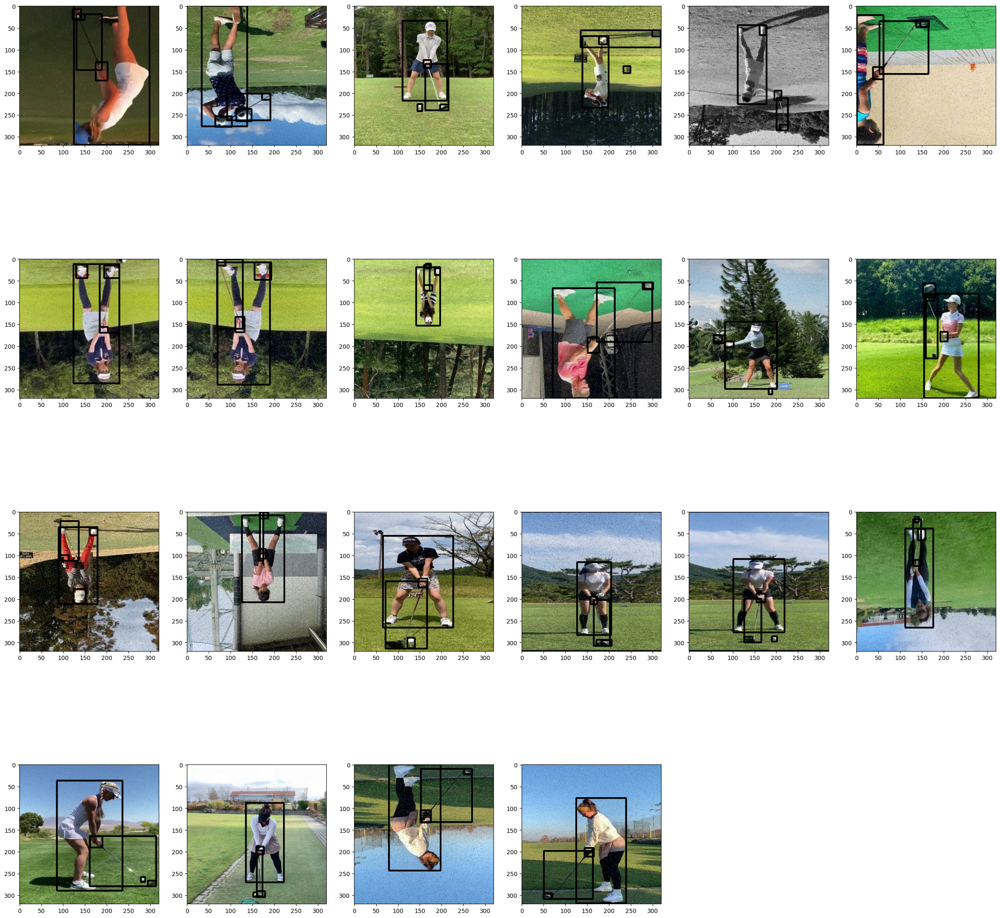

In [ ]:
dummy_scores = np.array([1.0,1.0,1.0,1.0,1.0], dtype=np.float32)  # give boxes a score of 100%

# plt.figure(figsize=(30, 30))
# for idx in range(0,22,1):
#   plt.subplot(4, 6, (idx//1)+1)
#   plot_detections(img_array[idx], label_info_numpy_array[idx], zero_indexed_groundtruth_classes, None, category_index)
# plt.show()

#### OpenCV visualization approach ####

In [ ]:
# import cv2

# image_path = "/content/drive/MyDrive/data/train/images"
# annotation_path = "/content/drive/MyDrive/data/train/labels"

# image_files = os.listdir(image_path)
# annotation_files = os.listdir(annotation_path)


# for img_file in image_files:
#     if img_file.endswith(".jpg") or img_file.endswith(".png"):
#         img = cv2.imread(os.path.join(image_path, img_file))

#         corresponding_annotation_file = img_file[:-4] + ".txt"
#         with open(os.path.join(annotation_path, corresponding_annotation_file), 'r') as f:
#             annotations = f.readlines()

#         for annotation in annotations:
#             label = annotation.strip().split(' ')
#             class_label, x_center, y_center, width, height = map(float, label)

#             img_h, img_w, _ = img.shape
#             x_min = int((x_center - width / 2) * img_w)
#             y_min = int((y_center - height / 2) * img_h)
#             x_max = int((x_center + width / 2) * img_w)
#             y_max = int((y_center + height / 2) * img_h)

#             # Overlay bounding box on the image
#             cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
#             cv2.putText(img, str(int(class_label)), (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36,255,12), 2)

#             # print(f"Image Name: {img_file}, Class Label: {int(class_label)}, Bounding Box: {x_min, y_min, x_max, y_max}")


#         plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#         plt.show()


### Get the model ###

In [ ]:
# Download the checkpoint and put it into models/research/object_detection/test_data/

# !wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
# !tar -xf ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
# !if [ -d "models/research/object_detection/test_data/checkpoint" ]; then rm -Rf models/research/object_detection/test_data/checkpoint; fi
# !mkdir models/research/object_detection/test_data/checkpoint
# !mv ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

# ssd_mobilenet_v2_320x320_coco17_tpu-8
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
!tar -xf ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
!if [ -d "models/research/object_detection/test_data/checkpoint" ]; then rm -Rf models/research/object_detection/test_data/checkpoint; fi
!mkdir models/research/object_detection/test_data/checkpoint
!mv ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2024-01-09 04:44:40--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.164.27, 172.217.0.91, 172.217.12.27, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.164.27|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M   126MB/s    in 0.2s    

2024-01-09 04:44:40 (126 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]



In [ ]:
# !wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
# !tar -xf ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
# !if [ -d "models/research/object_detection/test_data/checkpoint" ]; then rm -Rf models/research/object_detection/test_data/checkpoint; fi
# !mkdir models/research/object_detection/test_data/checkpoint
# !mv ssd_mobilenet_v2_320x320_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

#### Summary of ssdlite mobilenet ####

| Component    | Subcomponent        | Details                                                                         |
|--------------|---------------------|---------------------------------------------------------------------------------|
| SSD          | backbone            | SSDLiteFeatureExtractorMobileNet                                               |
|             |                     | - features                                                                      |
|             |                     |   - Sequential                                                                  |
|             |                     |     - Sequential                                                                 |
|             |                     |       - Conv2dNormActivation                                                   |
|             |                     |         - Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)|
|             |                     |         - BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)|
|             |                     |         - Hardswish()                                                          |
|             |                     |       - InvertedResidual                                                      |
|             |                     |         - block                                                                 |
|             |                     |           - Sequential                                                         |
|             |                     |             - Conv2dNormActivation                                            |
|             |                     |               - Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)|
|             |                     |               - BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)|
|             |                     |               - ReLU(inplace=True)                                           |
|             |                     |             - Conv2dNormActivation                                            |
|             |                     |               - Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)  |
|             |                     |               - BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)|
|             |                     |             ...                                                                 |
|             | extra               | ModuleList                                                                      |
|             |                     | - Sequential                                                                    |
|             |                     |   - Conv2dNormActivation                                                         |
|             |                     |     - Conv2d(480, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)            |
|             |                     |     - BatchNorm2d(256, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)|
|             |                     |     - ReLU6(inplace=True)                                                       |
|             |                     |   - Conv2dNormActivation                                                         |
|             |                     |     - Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=256, bias=False)|
|             |                     |     - BatchNorm2d(256, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)|
|             |                     |     - ReLU6(inplace=True)                                                       |
|             |                     |   - Conv2dNormActivation                                                         |
|             |                     |     - Conv2d(256, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)            |
|             |                     |     - BatchNorm2d(512, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)|
|             |                     |     - ReLU6(inplace=True)                                                       |
|             |                     | - ...                                                                           |
|             | anchor_generator    | DefaultBoxGenerator                                                             |
|             |                     | - aspect_ratios=[[2, 3], [2, 3], [2, 3], [2, 3], [2, 3], [2, 3]]                 |
|             |                     | - clip=True                                                                     |
|             |                     | - scales=[0.2, 0.35, 0.5, 0.65, 0.8, 0.95, 1.0]                               |
|             |                     | - steps=None                                                                     |
|             | head                | SSDLiteHead                                                                     |
|             |                     | - classification_head                                                           |
|             |                     | - regression_head                                                               |


In [ ]:
# def build(model_config, is_training, add_summaries=True):
#   """Builds a DetectionModel based on the model config.

#   Args:
#     model_config: A model.proto object containing the config for the desired
#       DetectionModel.
#     is_training: True if this model is being built for training purposes.
#     add_summaries: Whether to add tensorflow summaries in the model graph.
#   Returns:
#     DetectionModel based on the config.

#   Raises:
#     ValueError: On invalid meta architecture or model.
#   """
#   if not isinstance(model_config, model_pb2.DetectionModel):
#     raise ValueError('model_config not of type model_pb2.DetectionModel.')

#   meta_architecture = model_config.WhichOneof('model')

#   if meta_architecture not in META_ARCH_BUILDER_MAP:
#     raise ValueError('Unknown meta architecture: {}'.format(meta_architecture))
#   else:
#     build_func = META_ARCH_BUILDER_MAP[meta_architecture]
#     return build_func(getattr(model_config, meta_architecture), is_training,
#                       add_summaries)

## Fine tuning ##

Batch Normalization

https://stackoverflow.com/questions/63016740/why-its-necessary-to-frozen-all-inner-state-of-a-batch-normalization-layer-when

In [ ]:
tf.keras.backend.clear_session()
print('Building model and restoring weights for fine-tuning...', flush=True)

pipeline_config1 = 'models/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config'
checkpoint_path1 = 'models/research/object_detection/test_data/checkpoint/ckpt-0'

output_directory1 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs'
output_checkpoint_dir1 = os.path.join(output_directory1, 'checkpoint_6')
best_checkpoint_dir1 = os.path.join(output_directory1, 'best_checkpoint_4')

# https://github.com/tensorflow/models/blob/master/research/object_detection/utils/config_util.py

configs1 = config_util.get_configs_from_pipeline_file(pipeline_config1)
model_config1 = configs1['model']
model_config_pre1 = configs1['model']

model_config1.ssd.num_classes = num_classes
model_config1.ssd.freeze_batchnorm = False
model_config1.ssd.box_predictor.weight_shared_convolutional_box_predictor.conv_hyperparams.regularizer.l2_regularizer.weight = 0.1

# model_config.ssd.box_predictor.convolutional_box_predictor.use_dropout = True
# model_config.ssd.box_predictor.convolutional_box_predictor.dropout_keep_probability = 0.75

detection_model = model_builder.build(model_config=model_config1, is_training=True, add_summaries=True)


# https://github.com/tensorflow/models/blob/master/research/object_detection/builders/model_builder.py  "go to line 396"

# Save new pipeline config
pipeline_proto1 = config_util.create_pipeline_proto_from_configs(configs1)
config_util.save_pipeline_config(pipeline_proto1, output_directory1)

fake_box_predictor = tf.compat.v2.train.Checkpoint(_base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    # _prediction_heads=detection_model._box_predictor._prediction_heads,
    #    (i.e., the classification head that we *will not* restore)
    _box_prediction_head = detection_model._box_predictor._box_prediction_head,
    )

fake_model = tf.compat.v2.train.Checkpoint(_feature_extractor=detection_model._feature_extractor, _box_predictor=fake_box_predictor)

ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path1).expect_partial()

# Run model through a dummy image so that variables are created
image, shapes = detection_model.preprocess(tf.zeros([1, 320, 320, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)

print('config model Weights restored!')

Building model and restoring weights for fine-tuning...
config model Weights restored!


In [ ]:
tf.keras.backend.clear_session()
print('Pre_trained model and restoring weights for fine-tuning...', flush=True)

pipeline_config = 'models/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config'
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'

# This will be where we save checkpoint & config for TFLite conversion later.
output_directory = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train'
output_checkpoint_dir = os.path.join(output_directory, 'checkpoint_6')

configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config_pre = configs['model']

pre_model = model_builder.build(model_config=model_config_pre, is_training=False)

pipeline_proto = config_util.create_pipeline_proto_from_configs(configs)
config_util.save_pipeline_config(pipeline_proto, output_directory)

ckpt_pre = tf.compat.v2.train.Checkpoint(model=pre_model)
ckpt_pre.restore(checkpoint_path)

image_pre, shapes_pre = pre_model.preprocess(tf.zeros([1, 320, 320, 3]))
prediction_dict_pre = pre_model.predict(image_pre, shapes_pre)
_ = pre_model.postprocess(prediction_dict_pre, shapes_pre)

print('Vanilla model Weights restored!')

Pre_trained model and restoring weights for fine-tuning...
Vanilla model Weights restored!


In [ ]:
variable_names_without_arrays = [var.name.split(':')[0] for var in pre_model.non_trainable_variables]

for name in variable_names_without_arrays:
    print(name)

In [ ]:
# https://stackoverflow.com/questions/38160940/how-to-count-total-number-of-trainable-parameters-in-a-tensorflow-model
# p = np.sum([np.prod(v.get_shape().as_list()) for v in detection_model.trainable_variables()])
p = np.sum([np.prod(v.get_shape().as_list()) for v in pre_model.trainable_variables])
print(p/1000000, "Million")

2.626746 M


In [ ]:
p = np.sum([np.prod(v.get_shape().as_list()) for v in pre_model.non_trainable_variables])
print(p/1000000, "Million")

0.040256 M


In [ ]:
variable_names_without_arrays = [var.name.split(':')[0] for var in detection_model.trainable_variables]

for name in variable_names_without_arrays:
    print(name)

In [ ]:
import time
tf.keras.backend.set_learning_phase(True)

batch_size = dt_batch_size

trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead'
  ]

for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

def get_model_train_step_function(model, optimizer, vars_to_fine_tune):
  # Use tf.function for a bit of speed.   # Comment out the tf.function decorator if you want the inside of the function to run eagerly.
  tf.function
  def train_step_fn(image_tensors, groundtruth_boxes_list, groundtruth_classes_list):
    """A single training iteration.

    Args:
      image_tensors: A list of [1, height, width, 3] Tensor of type tf.float32.
        Note that the height and width can vary across images, as they are
        reshaped within this function to be 320x320.

      groundtruth_boxes_list: A list of Tensors of shape [N_i, 4] with type
        tf.float32 representing groundtruth boxes for each image in the batch.

      groundtruth_classes_list: A list of Tensors of shape [N_i, num_classes]
        with type tf.float32 representing groundtruth boxes for each image in
        the batch.

    Returns:
      A scalar tensor representing the total loss for the input batch.
    """
    true_shapes = tf.constant(batch_size * [[320, 320, 3]], dtype=tf.int32)

    model.provide_groundtruth( groundtruth_boxes_list=groundtruth_boxes_list, groundtruth_classes_list=groundtruth_classes_list)
    # https://github.com/tensorflow/models/blob/master/research/object_detection/core/model.py#L305

    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat([detection_model.preprocess(image_tensor)[0] for image_tensor in image_tensors], axis=0)

      prediction_dict = model.predict(preprocessed_images, true_shapes)
      losses_dict = model.loss(prediction_dict, true_shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))

    return total_loss, gradients, losses_dict

  return train_step_fn

https://www.blog.dailydoseofds.com/p/gradient-accumulation-increase-batch#:~:text=Under%20memory%20constraints%2C%20it%20is,explicitly%20increasing%20the%20batch%20size.

In [ ]:
def get_model_validation_step_function(model):
    def validation_step_fn(image_tensors, groundtruth_boxes_list, groundtruth_classes_list):
        true_shapes = tf.constant(batch_size * [[320, 320, 3]], dtype=tf.int32)

        model.provide_groundtruth(groundtruth_boxes_list=groundtruth_boxes_list, groundtruth_classes_list=groundtruth_classes_list)

        preprocessed_images = tf.concat([detection_model.preprocess(image_tensor)[0] for image_tensor in image_tensors], axis=0)

        prediction_dict = model.predict(preprocessed_images, true_shapes)
        losses_dict = model.loss(prediction_dict, true_shapes)
        val_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']

        return val_loss, losses_dict

    return validation_step_fn


In [ ]:
# variable_names_without_arrays = [var.name.split(':')[0] for var in to_fine_tune]

# for name in variable_names_without_arrays:
#     print(name)

Average Loss over batches

https://www.quora.com/What-is-the-formula-for-calculating-average-loss-for-batches

https://stackoverflow.com/questions/54053868/how-do-i-get-a-loss-per-epoch-and-not-per-batch

Gradient Accumulation

https://stackoverflow.com/questions/59893850/how-to-accumulate-gradients-in-tensorflow-2-0

https://gradientaccumulator.readthedocs.io/en/latest/background/gradient_accumulation.html

https://www.blog.dailydoseofds.com/p/gradient-accumulation-increase-batch#:~:text=Gradient%20accumulation%20modifies%20the%20last,for%20weights%20in%20the%20network.

https://stackoverflow.com/questions/59491896/pytorch-should-backward-function-be-in-the-loop-of-epoch-or-batch
https://stackoverflow.com/questions/47028323/tensfoflow-linear-regression-loss-increasing-instead-decreasing-with-successi
https://stackoverflow.com/questions/48027801/cannot-optimize-using-tf-reduce-sum-but-succeeded-using-tf-reduce-mean

In [ ]:
# lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
#     initial_learning_rate = 0.1,
#     decay_steps=10000,
#     decay_rate=0.95,
#     staircase=False)

# learning_rate = 0.1

optimizer = tf.keras.optimizers.SGD(learning_rate=0.15 , momentum=0.9)

train_step_fn = get_model_train_step_function(detection_model, optimizer, to_fine_tune)
validation_step_fn = get_model_validation_step_function(detection_model)

In [ ]:
exported_ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt_manager = tf.train.CheckpointManager(exported_ckpt, output_checkpoint_dir, max_to_keep=15, checkpoint_name="ckpt-ssd-latest-inc")

In [ ]:
checkpoint_dir = output_checkpoint_dir1

checkpoint = tf.compat.v2.train.Checkpoint(optimizer=optimizer, model=detection_model, epoch=tf.Variable(0, dtype=tf.int64))
checkpoint_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=100)
# bestcheck_manager = tf.train.CheckpointManager(checkpoint, best_checkpoint_dir, max_to_keep=100)

In [ ]:
from tensorflow import summary
log_dir = "/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/logs10"
summary_writer = summary.create_file_writer(log_dir)


In [ ]:
import tensorflow as tf

class CustomModelCheckpoint:
    def __init__(self, checkpoint, checkpoint_manager, monitor='val_loss', save_best_only=True, mode='min', verbose=1):
        self.checkpoint = checkpoint
        self.checkpoint_manager = checkpoint_manager
        self.monitor = monitor
        self.save_best_only = save_best_only
        self.mode = mode
        self.verbose = verbose
        self.best = float('inf') if mode == 'min' else float('-inf')
        self.best_epoch = 0

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        current_value = logs.get(self.monitor)
        if current_value is None:
            raise ValueError(f"Cannot monitor metric '{self.monitor}'.")

        if self.mode == 'min':
            improvement = current_value < self.best
        else:
            improvement = current_value > self.best

        if improvement:
            self.best = current_value
            self.best_epoch = epoch
            if self.save_best_only:
                self.save_best_model()
        elif not self.save_best_only:
            self.save_model(epoch, logs)

    def save_model(self, epoch, logs):
        self.checkpoint.epoch.assign(epoch + 1)
        self.checkpoint_manager.save()

    def save_best_model(self):
        if self.verbose > 0:
            print(f"\nEpoch {self.best_epoch + 1}: {self.monitor} improved to {self.best}, saving best model checkpoint.")
        self.checkpoint_manager.save()

checkpoint = tf.train.Checkpoint(optimizer=optimizer, model=detection_model, epoch=tf.Variable(0, dtype=tf.int64))

 # Keep only the best checkpoint
best_checkpoint_manager = tf.train.CheckpointManager(checkpoint, best_checkpoint_dir1, max_to_keep=1)
custom_checkpoint = CustomModelCheckpoint(checkpoint=checkpoint, checkpoint_manager=best_checkpoint_manager, monitor='val_loss', save_best_only=True)


In [ ]:
# 3rd loop

print('Start fine-tuning!', flush=True)

num_epochs = 30
patience = 5
wait = 0
best = float('inf')
best_val_loss = float('inf')
best_epoch = 0


start_time = time.time()

for epoch in tqdm(range(num_epochs)):
  print(f"Epoch {epoch + 1}/{num_epochs}")

  total_loss_accumulator = 0.0
  validation_loss_accumulator = 0.0
  accum_gradient = [tf.zeros_like(v) for v in to_fine_tune]
  i = 0
  j = 0

  for idx, batch in enumerate(image_dataset):
      modified_images = [tf.expand_dims(image, axis=0) for image in batch]
      image_batch = list(modified_images)

      all_keys = list(range(len(image_batch)))
      random.shuffle(all_keys)
      example_keys = all_keys

      gt_boxes_list = [gt_box_list[i][key] for key in all_keys]
      gt_classes_list = [gt_class_list[key] for key in all_keys]
      image_tensors = [image_batch[key] for key in all_keys]

      total_loss, gradients, tlossdic  = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)
      total_loss_accumulator += total_loss.numpy()

      with summary_writer.as_default():
        for grad, var in zip(gradients, to_fine_tune):
                tf.summary.histogram(var.name + '/gradient', grad, step=epoch)

      with summary_writer.as_default():
        for loss_name, loss_value in tlossdic.items():
            tf.summary.scalar(f"Train_Loss/{loss_name}", loss_value, step=epoch)

      if idx % 40 == 0:
        elapsed_time = time.time() - start_time
        print(f'Epoch {epoch + 1}/{num_epochs}, ,Batch {idx+1}/{len(image_dataset)}, Loss={total_loss.numpy()}, Time Elapsed={elapsed_time/60} minutes', flush=True)

  i += 1
  average_loss = total_loss_accumulator / len(image_dataset)   ### Check this again ###
  print(f" Epoch {epoch + 1}  , Average_loss : {average_loss}")

  checkpoint_manager.save(checkpoint_number= epoch)

  validation_step_fn = get_model_validation_step_function(detection_model)

  for idx, batch in enumerate(validation_ds):
      modified_images = [tf.expand_dims(image, axis=0) for image in batch]
      image_batch = list(modified_images)

      all_keys = list(range(len(image_batch)))
      random.shuffle(all_keys)
      example_keys = all_keys

      gt_boxes_list = [val_box_list[j][key] for key in example_keys]
      gt_classes_list = [gt_class_list[key] for key in example_keys]
      image_tensors = [image_batch[key] for key in example_keys]

      validation_loss, vlossdic = validation_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

      validation_loss_accumulator += validation_loss.numpy()

      with summary_writer.as_default():
        for loss_name, loss_value in vlossdic.items():
            tf.summary.scalar(f"Val_Loss/{loss_name}", loss_value, step=epoch)

  j += 1
  average_validation_loss = validation_loss_accumulator / len(validation_ds)
  print(f"Epoch {epoch + 1}/{num_epochs}, Average Validation Loss: {average_validation_loss}")

  custom_checkpoint.on_epoch_end(epoch, {'val_loss': average_validation_loss})

  with summary_writer.as_default():

    tf.summary.scalar("Average Training Loss", average_loss, step=epoch)
    tf.summary.scalar("Average Validation Loss", average_validation_loss, step=epoch)

  wait += 1
  if average_validation_loss < best:
    best = average_validation_loss
    wait = 0

  if wait >= patience:
    break

summary_writer.close()

In [ ]:
# # 3rd loop

# print('Start fine-tuning!', flush=True)

# num_epochs = 89
# patience = 20
# wait = 0
# best = float('inf')
# best_epoch = 0

# start_time = time.time()

# for epoch in tqdm(range(num_epochs)):
#   print(f"Epoch {epoch + 1}/{num_epochs}")

#   total_loss_accumulator = 0.0
#   validation_loss_accumulator = 0.0
#   accum_gradient = [tf.zeros_like(v) for v in to_fine_tune]
#   i = 0
#   j = 0

#   for idx, batch in enumerate(image_dataset):
#       modified_images = [tf.expand_dims(image, axis=0) for image in batch]
#       image_batch = list(modified_images)

#       all_keys = list(range(len(image_batch)))
#       random.shuffle(all_keys)
#       example_keys = all_keys

#       gt_boxes_list = [gt_box_list[i][key] for key in all_keys]
#       gt_classes_list = [gt_class_list[key] for key in all_keys]
#       image_tensors = [image_batch[key] for key in all_keys]

#       total_loss, gradients  = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)
#       total_loss_accumulator += total_loss.numpy()

#       # accum_gradient = [(acum_grad+grad) for acum_grad, grad in zip(accum_gradient, gradients)]
#       # Here I do this to accumulate the gradients of every batch in an each epoch before updating the
#       # weights
#       # optimizer.apply_gradients(zip(gradients,to_fine_tune))

#       if idx % 40 == 0:
#         elapsed_time = time.time() - start_time
#         print(f'Epoch {epoch + 1}/{num_epochs}, ,Batch {idx+1}/{len(image_dataset)}, Loss={total_loss.numpy()}, Time Elapsed={elapsed_time/60} minutes', flush=True)

#   # accum_gradient = [grad/len(image_dataset) for grad in accum_gradient]
#   # optimizer.apply_gradients(zip(accum_gradient,to_fine_tune))

#   i += 1
#   average_loss = total_loss_accumulator / len(image_dataset)   ### Check this again ###
#   print(f" Epoch {epoch + 1}  , Average_loss : {average_loss}")

#   checkpoint_manager.save(checkpoint_number= epoch)

#   validation_step_fn = get_model_validation_step_function(detection_model)

#   for idx, batch in enumerate(validation_ds):
#       modified_images = [tf.expand_dims(image, axis=0) for image in batch]
#       image_batch = list(modified_images)

#       all_keys = list(range(len(image_batch)))
#       random.shuffle(all_keys)
#       example_keys = all_keys

#       gt_boxes_list = [val_box_list[j][key] for key in example_keys]
#       gt_classes_list = [gt_class_list[key] for key in example_keys]
#       image_tensors = [image_batch[key] for key in example_keys]

#       validation_loss = validation_step_fn(image_tensors, gt_boxes_list, gt_classes_list)
#       validation_loss_accumulator += validation_loss.numpy()

#   j += 1
#   average_validation_loss = validation_loss_accumulator / len(validation_ds)
#   print(f"Epoch {epoch + 1}/{num_epochs}, Average Validation Loss: {average_validation_loss}")

#   with summary_writer.as_default():

#     tf.summary.scalar("Average Training Loss", average_loss, step=epoch)
#     tf.summary.scalar("Average Validation Loss", average_validation_loss, step=epoch)

#   if average_loss < best:
#     best_training_loss = average_loss
#     best_epoch = epoch

#     if bestcheck_manager.checkpoints:
#       bestcheck_manager._checkpoint_prefix = bestcheck_manager.checkpoints[-1]

#     bestcheck_manager.save(checkpoint_number=best_epoch)

#   wait += 1
#   if average_validation_loss < best:
#     best = average_validation_loss
#     wait = 0

#   if wait >= patience:
#     break

# summary_writer.close()


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/logs10

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/logs8

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/logs7

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/logs6

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/logs5

######

<IPython.core.display.Javascript object>

https://medium.com/neuronio/using-tensorboard-e3906a5798e6

Tensorboard histogram bad examples:

All values are very close to zero

Uniform Distribution

https://www.youtube.com/watch?v=jJ2iGWtoCEA

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/logs4

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/logs3

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/logs2

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/logs1

### Checkpoint ###

Restore trained checkpoint 2

In [ ]:
# checkpoint_path1 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/checkpoint/ckpt-ssd-1'
checkpoint_path2 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/best_checkpoint_4/ckpt-7'

exported_ckpt2 = tf.compat.v2.train.Checkpoint(model=detection_model)
exported_ckpt2.restore(checkpoint_path2)

Restore trained checkpoint 1

In [ ]:
checkpoint_path1 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/checkpoint/ckpt-ssd-1'
# checkpoint_path3 = '/content/drive/Shareddrives/TeamTeal/GDino/data/Train/train/runs/checkpoint_5/ckpt-16'

exported_ckpt2 = tf.compat.v2.train.Checkpoint(model=detection_model)
exported_ckpt2.restore(checkpoint_path1)
# exported_ckpt2.restore(checkpoint_path2)

##Export & run with TensorFlow Lite ##

## Model Conversion

First, we invoke the `export_tflite_graph_tf2.py` script to generate a TFLite-friendly intermediate SavedModel. This will then be passed to the TensorFlow Lite Converter for generating the final model.

To know more about this process, please look at [this documentation](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/running_on_mobile_tf2.md).

In [ ]:
print(tf.__version__)

In [ ]:
# %%bash
# python models/research/object_detection/export_tflite_graph_tf2.py \
#   --pipeline_config_path output/pipeline.config \
#   --trained_checkpoint_dir output/checkpoint \
#   --output_directory tflite

In [ ]:
# !tflite_convert --saved_model_dir=tflite/saved_model --output_file=tflite/model.tflite


### Test model ###

In [ ]:
test_image_dir = '/content/drive/Shareddrives/TeamTeal/GDino/data/Test/test0/images'
# /content/drive/MyDrive/data/test
test_labels_dir = '/content/drive/Shareddrives/TeamTeal/GDino/data/Test/test0/labels'
test_images_np = []

test_files = sorted([file_name for file_name in os.listdir(test_image_dir) if file_name.endswith('.jpg')])
label_files = sorted([file for file in os.listdir(test_labels_dir) if file.endswith('.txt')])

for file_name in test_files:
    if file_name.endswith('.jpg'):
        image_path = os.path.join(test_image_dir, file_name)
        test_images_np.append(np.expand_dims(image_into_numpy_array_frompath(image_path), axis=0))


In [ ]:
'''
Models

1) Pre_model = pre_trained ssd mobilenetV2 on coco
2) detection_model = custom model pre_trained on golf data

'''

In [ ]:
# Again, uncomment this decorator if you want to run inference eagerly
@tf.function
def detect(input_tensor):

  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)

  # preprocessed_image, shapes = pre_model.preprocess(input_tensor)
  # prediction_dict = pre_model.predict(preprocessed_image, shapes)
  # return pre_model.postprocess(prediction_dict, shapes)

In [ ]:
from object_detection.core import post_processing

import warnings
warnings.simplefilter('ignore')
tf.config.run_functions_eagerly(True)

def nms(detections):

    detection_boxes = detections['detection_boxes']
    detection_scores = detections['detection_scores']
    detection_classes = detections['detection_classes']

    reshaped_boxes = tf.reshape(detection_boxes, [100, 4])
    reshaped_scores = tf.reshape(detection_scores, [100])

    selected_indices = tf.image.non_max_suppression(
        boxes=reshaped_boxes,
        scores=reshaped_scores,
        score_threshold=0.15,
        iou_threshold=0.2,
        max_output_size= 5
    )

    return selected_indices

    # https://github.com/tensorflow/tensorflow/blob/v2.14.0/tensorflow/python/ops/image_ops_impl.py#L3768-L3818


In [ ]:
test_detections = []
indices = []

for i in range(len(test_images_np)):
  input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
  detections = detect(input_tensor)
  selected_indices = nms(detections)

  test_detections.append(detections)
  indices.append(selected_indices)

In [ ]:
# for i in detections.keys():
#   print(i)
# selected_indices_tensor = tf.concat(test_detections, axis=0)
# selected_indices_tensor
# filtered_boxes_np = np.array([np.array(sublist, dtype=object) for sublist in filtered_A], dtype=object)

In [ ]:
test_detections

In [ ]:
reshaped_boxes1, reshaped_scores1, reshaped_classes1 =[],[],[]
for i in range(len(test_images_np)):
  detection_boxes = test_detections[i]['detection_boxes']
  detection_scores = test_detections[i]['detection_scores']
  detection_classes = test_detections[i]['detection_classes']

  reshaped_boxes = tf.reshape(detection_boxes, [100, 4])
  reshaped_scores = tf.reshape(detection_scores, [100])
  reshaped_classes = tf.reshape(detection_classes, [100])


  reshaped_boxes1.append(reshaped_boxes)
  reshaped_scores1.append(reshaped_scores)
  reshaped_classes1.append(reshaped_classes)


In [ ]:

selected_box, selected_score, selected_class = [],[],[]
for i in range(len(test_images_np)):
  selected_boxes = tf.gather(reshaped_boxes1[i], indices[i])
  selected_scores = tf.gather(reshaped_scores1[i], indices[i])
  selected_classes = tf.gather(reshaped_classes1[i],indices[i] )

  selected_box.append(selected_boxes)
  selected_score.append(selected_scores)
  selected_class.append(selected_classes)

filtered_prediction_dict = {
      'detection_boxes': selected_box,
      'detection_classes': selected_class,
      'detection_scores': selected_score
  }

In [ ]:
# A,B,C =[],[],[]

# for i in range(len(test_detections)):
#   A.append(test_detections[i]['detection_boxes'])
#   B.append(test_detections[i]['detection_classes'])
#   C.append(test_detections[i]['detection_scores'])

# A = np.array(A)
# B = np.array(B)
# C = np.array(C)

In [ ]:
# score_threshold = 0.4
# filtered_A, filtered_B, filtered_C = [], [], []

#  Function to apply the comparison element-wise
# compare = np.vectorize(lambda x: x > score_threshold)

# for a_list, b_list, c_list in zip(A, B, C):
#     mask = compare(c_list)
#     filtered_A.append(list(np.array(a_list)[mask]))
#     filtered_B.append(list(np.array(b_list)[mask]))
#     filtered_C.append(list(c_list[mask]))

In [ ]:
filtered_prediction_dict

In [ ]:
coco_category_index = {
    0: {"id": 3, "name": "person"},
    1: {"id": 2, "name": "bicycle"},
    2: {"id": 1, "name": "car"},
    3: {"id": 4, "name": "motorbike"},
    4: {"id": 5, "name": "aeroplane"},
    5: {"id": 6, "name": "bus"},
    6: {"id": 7, "name": "train"},
    7: {"id": 8, "name": "truck"},
    8: {"id": 9, "name": "boat"},
    9: {"id": 10, "name": "traffic light"},
    10: {"id": 11, "name": "fire hydrant"},
    11: {"id": 12, "name": "stop sign"},
    12: {"id": 13, "name": "parking meter"},
    13: {"id": 14, "name": "bench"},
    14: {"id": 15, "name": "bird"},
    15: {"id": 16, "name": "cat"},
    16: {"id": 17, "name": "dog"},
    17: {"id": 18, "name": "horse"},
    18: {"id": 19, "name": "sheep"},
    19: {"id": 20, "name": "cow"},
    20: {"id": 21, "name": "elephant"},
    21: {"id": 22, "name": "bear"},
    22: {"id": 23, "name": "zebra"},
    23: {"id": 24, "name": "giraffe"},
    24: {"id": 25, "name": "backpack"},
    25: {"id": 26, "name": "umbrella"},
    26: {"id": 27, "name": "handbag"},
    27: {"id": 28, "name": "tie"},
    28: {"id": 29, "name": "suitcase"},
    29: {"id": 30, "name": "frisbee"},
    30: {"id": 31, "name": "skis"},
    31: {"id": 32, "name": "snowboard"},
    32: {"id": 33, "name": "sports ball"},
    33: {"id": 34, "name": "kite"},
    34: {"id": 35, "name": "baseball bat"},
    35: {"id": 36, "name": "baseball glove"},
    36: {"id": 37, "name": "skateboard"},
    37: {"id": 38, "name": "surfboard"},
    38: {"id": 39, "name": "tennis racket"},
    39: {"id": 40, "name": "bottle"},
    40: {"id": 41, "name": "wine glass"},
    41: {"id": 42, "name": "cup"},
    42: {"id": 43, "name": "fork"},
    43: {"id": 44, "name": "knife"},
    44: {"id": 45, "name": "spoon"},
    45: {"id": 46, "name": "bowl"},
    46: {"id": 47, "name": "banana"},
    47: {"id": 48, "name": "apple"},
    48: {"id": 49, "name": "sandwich"},
    49: {"id": 50, "name": "orange"},
    50: {"id": 51, "name": "broccoli"},
    51: {"id": 52, "name": "carrot"},
    52: {"id": 53, "name": "hot dog"},
    53: {"id": 54, "name": "pizza"},
    54: {"id": 55, "name": "donut"},
    55: {"id": 56, "name": "cake"},
    56: {"id": 57, "name": "chair"},
    57: {"id": 58, "name": "sofa"},
    58: {"id": 59, "name": "potted plant"},
    59: {"id": 60, "name": "bed"},
    60: {"id": 61, "name": "dining table"},
    61: {"id": 62, "name": "toilet"},
    62: {"id": 63, "name": "tv monitor"},
    63: {"id": 64, "name": "laptop"},
    64: {"id": 65, "name": "mouse"},
    65: {"id": 66, "name": "remote"},
    66: {"id": 67, "name": "keyboard"},
    67: {"id": 68, "name": "cell phone"},
    68: {"id": 69, "name": "microwave"},
    69: {"id": 70, "name": "oven"},
    70: {"id": 71, "name": "toaster"},
    71: {"id": 72, "name": "sink"},
    72: {"id": 73, "name": "refrigerator"},
    73: {"id": 74, "name": "book"},
    74: {"id": 75, "name": "clock"},
    75: {"id": 76, "name": "vase"},
    76: {"id": 77, "name": "scissors"},
    77: {"id": 78, "name": "teddy bear"},
    78: {"id": 79, "name": "hair drier"},
    79: {"id": 80, "name": "toothbrush"},
}


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

display_width = 800

for image_index in range(len(filtered_prediction_dict['detection_boxes'])):
    test_image = test_images_np[image_index][0]
    test_image_bgr = cv2.cvtColor(test_image, cv2.COLOR_RGB2BGR)

    for detection_box, detection_score, detection_class in zip(
            filtered_prediction_dict['detection_boxes'][image_index],
            filtered_prediction_dict['detection_scores'][image_index],
            filtered_prediction_dict['detection_classes'][image_index]):
        ymin, xmin, ymax, xmax = detection_box
        xmin = int(xmin * test_image.shape[1])
        xmax = int(xmax * test_image.shape[1])
        ymin = int(ymin * test_image.shape[0])
        ymax = int(ymax * test_image.shape[0])
        class_name = coco_category_index[int(detection_class)]
        display_text = f"{class_name}: {detection_score:.2f}"
        cv2.rectangle(test_image_bgr, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        cv2.putText(test_image_bgr, display_text, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    aspect_ratio = test_image_bgr.shape[1] / test_image_bgr.shape[0]
    display_height = int(display_width / aspect_ratio)
    resized_image = cv2.resize(test_image_bgr, (display_width, display_height))

    cv2_imshow(resized_image)
    cv2.waitKey(0)

cv2.destroyAllWindows()


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

display_width = 800

for image_index in range(len(filtered_prediction_dict['detection_boxes'])):
    test_image = test_images_np[image_index][0]
    test_image_bgr = cv2.cvtColor(test_image, cv2.COLOR_RGB2BGR)

    for detection_box, detection_score, detection_class in zip(
            filtered_prediction_dict['detection_boxes'][image_index],
            filtered_prediction_dict['detection_scores'][image_index],
            filtered_prediction_dict['detection_classes'][image_index]):
        ymin, xmin, ymax, xmax = detection_box
        xmin = int(xmin * test_image.shape[1])
        xmax = int(xmax * test_image.shape[1])
        ymin = int(ymin * test_image.shape[0])
        ymax = int(ymax * test_image.shape[0])
        class_name = category_index[int(detection_class)]
        display_text = f"{class_name}: {detection_score:.2f}"
        cv2.rectangle(test_image_bgr, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        cv2.putText(test_image_bgr, display_text, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    aspect_ratio = test_image_bgr.shape[1] / test_image_bgr.shape[0]
    display_height = int(display_width / aspect_ratio)
    resized_image = cv2.resize(test_image_bgr, (display_width, display_height))

    cv2_imshow(resized_image)
    cv2.waitKey(0)

cv2.destroyAllWindows()


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

display_width = 800

for image_index in range(len(filtered_prediction_dict['detection_boxes'])):
    test_image = test_images_np[image_index][0]
    test_image_bgr = cv2.cvtColor(test_image, cv2.COLOR_RGB2BGR)

    for detection_box, detection_score, detection_class in zip(
            filtered_prediction_dict['detection_boxes'][image_index],
            filtered_prediction_dict['detection_scores'][image_index],
            filtered_prediction_dict['detection_classes'][image_index]):
        ymin, xmin, ymax, xmax = detection_box
        xmin = int(xmin * test_image.shape[1])
        xmax = int(xmax * test_image.shape[1])
        ymin = int(ymin * test_image.shape[0])
        ymax = int(ymax * test_image.shape[0])
        class_name = category_index[int(detection_class)]
        display_text = f"{class_name}: {detection_score:.2f}"
        cv2.rectangle(test_image_bgr, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        cv2.putText(test_image_bgr, display_text, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    aspect_ratio = test_image_bgr.shape[1] / test_image_bgr.shape[0]
    display_height = int(display_width / aspect_ratio)
    resized_image = cv2.resize(test_image_bgr, (display_width, display_height))

    cv2_imshow(resized_image)
    cv2.waitKey(0)

cv2.destroyAllWindows()


https://www.youtube.com/watch?v=-HbCA0WGbBg

In [ ]:
import numpy as np

def calculate_iou(box1, box2):
    y_min1, x_min1, y_max1, x_max1 = box1
    y_min2, x_min2, y_max2, x_max2 = box2

    intersection_ymin = max(y_min1, y_min2)
    intersection_xmin = max(x_min1, x_min2)
    intersection_ymax = min(y_max1, y_max2)
    intersection_xmax = min(x_max1, x_max2)

    intersection_area = max(0, intersection_ymax - intersection_ymin) * max(0, intersection_xmax - intersection_xmin)

    box1_area = (y_max1 - y_min1) * (x_max1 - x_min1)
    box2_area = (y_max2 - y_min2) * (x_max2 - x_min2)

    iou = intersection_area / (box1_area + box2_area - intersection_area)
    return iou

def calculate_precision_recall_per_image(pred_boxes, target_boxes, iou_threshold= 0.5):
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    for pred_box in pred_boxes:
        pred_class, pred_score, pred_box_coords = pred_box

        iou_max = 0
        matched_target = None

        for target_box in target_boxes:
            target_class, target_box_coords = target_box

            if pred_class == target_class:
                iou = calculate_iou(pred_box_coords, target_box_coords)
                if iou > iou_max:
                    iou_max = iou
                    matched_target = target_box

        if iou_max >= iou_threshold:
            true_positives += 1
            target_boxes.remove(matched_target)
        else:
            false_positives += 1

    false_negatives = len(target_boxes)

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0.0
    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0.0

    return precision, recall


def calculate_average_precision_per_image(predictions, ground_truth_labels, num_classes=5, iou_threshold=0.5):
    average_precisions = []

    for image_index in range(len(predictions)):
        image_predictions = predictions[image_index]
        image_targets = ground_truth_labels[image_index]

        class_predictions_dict = {class_id: [] for class_id in range(1,num_classes+1)}
        class_targets_dict = {class_id: [] for class_id in range(1, num_classes+1)}

        for pred_box in image_predictions:
            class_id, _, _ = pred_box
            class_predictions_dict[class_id].append(pred_box)

        for target_box in image_targets:
            class_id, _ = target_box
            class_targets_dict[class_id].append(target_box)

        class_precisions = []
        for class_id in range(1,num_classes+1):
            class_predictions = class_predictions_dict[class_id]
            class_targets = class_targets_dict[class_id]

            precision, recall = calculate_precision_recall_per_image(class_predictions, class_targets, iou_threshold)
            class_precisions.append(precision)

        average_precisions.append(np.mean(class_precisions))

    mAP = np.mean(average_precisions)
    return mAP

def calculate_AP_per_class(predictions, ground_truth_labels, num_classes=5, iou_threshold=0.5):
    average_precisions = {class_id: [] for class_id in range(1, num_classes + 1)}

    for image_index in range(len(predictions)):
        image_predictions = predictions[image_index]
        image_targets = ground_truth_labels[image_index]

        class_predictions_dict = {class_id: [] for class_id in range(1, num_classes + 1)}
        class_targets_dict = {class_id: [] for class_id in range(1, num_classes + 1)}

        for pred_box in image_predictions:
            class_id, _, _ = pred_box
            class_predictions_dict[class_id].append(pred_box)

        for target_box in image_targets:
            class_id, _ = target_box
            class_targets_dict[class_id].append(target_box)

        for class_id in range(1, num_classes + 1):
            class_predictions = class_predictions_dict[class_id]
            class_targets = class_targets_dict[class_id]

            precision, _ = calculate_precision_recall_per_image(class_predictions, class_targets, iou_threshold)
            average_precisions[class_id].append(precision)

    class_avg_precisions = {class_id: np.mean(precisions) for class_id, precisions in average_precisions.items()}
    return class_avg_precisions



In [ ]:
predictions = []

for i in range(len(test_images_np)):
    image_predictions = []

    for j in range(len(filtered_prediction_dict['detection_boxes'][i])):
        class_id = int(filtered_prediction_dict['detection_classes'][i][j].numpy())
        confidence = filtered_prediction_dict['detection_scores'][i][j].numpy()
        box_coordinates = filtered_prediction_dict['detection_boxes'][i][j].numpy()

        image_predictions.append((class_id, confidence, box_coordinates))

    predictions.append(image_predictions)


In [ ]:
ground_truth_labels = []

for file_name in test_files:
    if file_name.endswith('.jpg'):
        label_file_name = os.path.splitext(file_name)[0] + '.txt'
        label_path = os.path.join(test_labels_dir, label_file_name)
        with open(label_path, 'r') as f:
            lines = f.readlines()
            image_labels = []
            for line in lines:
                parts = line.split()
                class_id = int(parts[0]) +1

                x_center, y_center, width, height = [float(parts[i]) for i in range(1, 5)]
                x_min = x_center - width / 2
                y_min = y_center - height / 2
                x_max = x_center + width / 2
                y_max = y_center + height / 2

                image_labels.append((class_id, [y_min, x_min, y_max, x_max]))

            ground_truth_labels.append(image_labels)


In [ ]:
# mAP = calculate_average_precision_per_image(predictions, ground_truth_labels, num_classes=5, iou_threshold=0.5)
# print("mAP:", mAP)

In [ ]:
# class_avg_precisions = calculate_AP_per_class(predictions, ground_truth_labels, num_classes=5, iou_threshold=0.5)

# for class_id, avg_precision in class_avg_precisions.items():
#     print(f'Class {class_id}: Average Precision = {avg_precision}')

In [ ]:
def main():
    iou_threshold = float(input("Enter IoU threshold : "))

    mAP = calculate_average_precision_per_image(predictions, ground_truth_labels, num_classes=5, iou_threshold=iou_threshold)
    print("mAP:", mAP)

    class_avg_precisions = calculate_AP_per_class(predictions, ground_truth_labels, num_classes=5, iou_threshold=iou_threshold)

    for class_id, avg_precision in class_avg_precisions.items():
        print(f'Class {class_id}: Average Precision = {avg_precision}')

if __name__ == "__main__":
    main()

Enter IoU threshold : 0.5
mAP: 0.1470238095238095
Class 1: Average Precision = 0.125
Class 2: Average Precision = 0.16071428571428573
Class 3: Average Precision = 0.4494047619047619
Class 4: Average Precision = 0.0
Class 5: Average Precision = 0.0


In [ ]:
import numpy as np

predictions = []

for i in range(len(test_images_np)):
    image_predictions = []

    for j in range(len(filtered_prediction_dict['detection_boxes'][i])):
        class_id = int(filtered_prediction_dict['detection_classes'][i][j].numpy())
        confidence = filtered_prediction_dict['detection_scores'][i][j].numpy()
        box_coordinates = filtered_prediction_dict['detection_boxes'][i][j].numpy()

        image_predictions.append((class_id, confidence, box_coordinates))

    predictions.append(image_predictions)

ground_truth_labels = []

for file_name in test_files:
    if file_name.endswith('.jpg'):
        label_file_name = os.path.splitext(file_name)[0] + '.txt'
        label_path = os.path.join(test_labels_dir, label_file_name)
        with open(label_path, 'r') as f:
            lines = f.readlines()
            image_labels = []
            for line in lines:
                parts = line.split()
                class_id = int(parts[0]) +1

                x_center, y_center, width, height = [float(parts[i]) for i in range(1, 5)]
                x_min = x_center - width / 2
                y_min = y_center - height / 2
                x_max = x_center + width / 2
                y_max = y_center + height / 2

                image_labels.append((class_id, [y_min, x_min, y_max, x_max]))

            ground_truth_labels.append(image_labels)

def calculate_iou(box1, box2):
    y_min1, x_min1, y_max1, x_max1 = box1
    y_min2, x_min2, y_max2, x_max2 = box2

    intersection_ymin = max(y_min1, y_min2)
    intersection_xmin = max(x_min1, x_min2)
    intersection_ymax = min(y_max1, y_max2)
    intersection_xmax = min(x_max1, x_max2)

    intersection_area = max(0, intersection_ymax - intersection_ymin) * max(0, intersection_xmax - intersection_xmin)

    box1_area = (y_max1 - y_min1) * (x_max1 - x_min1)
    box2_area = (y_max2 - y_min2) * (x_max2 - x_min2)

    iou = intersection_area / (box1_area + box2_area - intersection_area)
    return iou

def calculate_precision_recall_per_image(pred_boxes, target_boxes, iou_threshold= 0.5):
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    for pred_box in pred_boxes:
        pred_class, pred_score, pred_box_coords = pred_box

        iou_max = 0
        matched_target = None

        for target_box in target_boxes:
            target_class, target_box_coords = target_box

            if pred_class == target_class:
                iou = calculate_iou(pred_box_coords, target_box_coords)
                if iou > iou_max:
                    iou_max = iou
                    matched_target = target_box

        if iou_max >= iou_threshold:
            true_positives += 1
            target_boxes.remove(matched_target)
        else:
            false_positives += 1

    false_negatives = len(target_boxes)

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0.0
    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0.0

    return precision, recall


def calculate_average_precision_per_image(predictions, ground_truth_labels, num_classes=5, iou_threshold=0.5):
    average_precisions = []

    for image_index in range(len(predictions)):
        image_predictions = predictions[image_index]
        image_targets = ground_truth_labels[image_index]

        class_predictions_dict = {class_id: [] for class_id in range(1,num_classes+1)}
        class_targets_dict = {class_id: [] for class_id in range(1, num_classes+1)}

        for pred_box in image_predictions:
            class_id, _, _ = pred_box
            class_predictions_dict[class_id].append(pred_box)

        for target_box in image_targets:
            class_id, _ = target_box
            class_targets_dict[class_id].append(target_box)

        class_precisions = []
        for class_id in range(1,num_classes+1):
            class_predictions = class_predictions_dict[class_id]
            class_targets = class_targets_dict[class_id]

            precision, recall = calculate_precision_recall_per_image(class_predictions, class_targets, iou_threshold)
            class_precisions.append(precision)

        average_precisions.append(np.mean(class_precisions))

    mAP = np.mean(average_precisions)
    return mAP

def calculate_AP_per_class(predictions, ground_truth_labels, num_classes=5, iou_threshold=0.5):
    average_precisions = {class_id: [] for class_id in range(1, num_classes + 1)}

    for image_index in range(len(predictions)):
        image_predictions = predictions[image_index]
        image_targets = ground_truth_labels[image_index]

        class_predictions_dict = {class_id: [] for class_id in range(1, num_classes + 1)}
        class_targets_dict = {class_id: [] for class_id in range(1, num_classes + 1)}

        for pred_box in image_predictions:
            class_id, _, _ = pred_box
            class_predictions_dict[class_id].append(pred_box)

        for target_box in image_targets:
            class_id, _ = target_box
            class_targets_dict[class_id].append(target_box)

        for class_id in range(1, num_classes + 1):
            class_predictions = class_predictions_dict[class_id]
            class_targets = class_targets_dict[class_id]

            precision, _ = calculate_precision_recall_per_image(class_predictions, class_targets, iou_threshold)
            average_precisions[class_id].append(precision)

    class_avg_precisions = {class_id: np.mean(precisions) for class_id, precisions in average_precisions.items()}
    return class_avg_precisions


mAP = calculate_average_precision_per_image(predictions, ground_truth_labels, num_classes=5, iou_threshold=0.5)
print("mAP:", mAP)

class_avg_precisions = calculate_AP_per_class(predictions, ground_truth_labels, num_classes=5, iou_threshold=0.5)

for class_id, avg_precision in class_avg_precisions.items():
    print(f'Class {class_id}: Average Precision = {avg_precision}')